# **Install and authenticate Kaggle API**

In [1]:

!pip install -q kaggle

# Upload your kaggle.json (API token file)
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account

# Make a directory for Kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


# **Download the dataset from Kaggle**

In [2]:

!kaggle datasets download -d akhatova/pcb-defects

# Unzip dataset
!unzip -q pcb-defects.zip -d ./pcb_defects


Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
 98% 1.84G/1.88G [00:15<00:00, 253MB/s]
100% 1.88G/1.88G [00:15<00:00, 131MB/s]


#**Importing the standard libraries**

In [3]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')

import warnings
warnings.filterwarnings('ignore')


# **Understanding the dataset**

In [4]:
#Defining the input
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['Annotations', 'rotate.py', 'rotation', 'images', 'PCB_USED']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





# **Analyzing the PCB USED folder**

In [5]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

# **visualize images**

In [6]:

def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

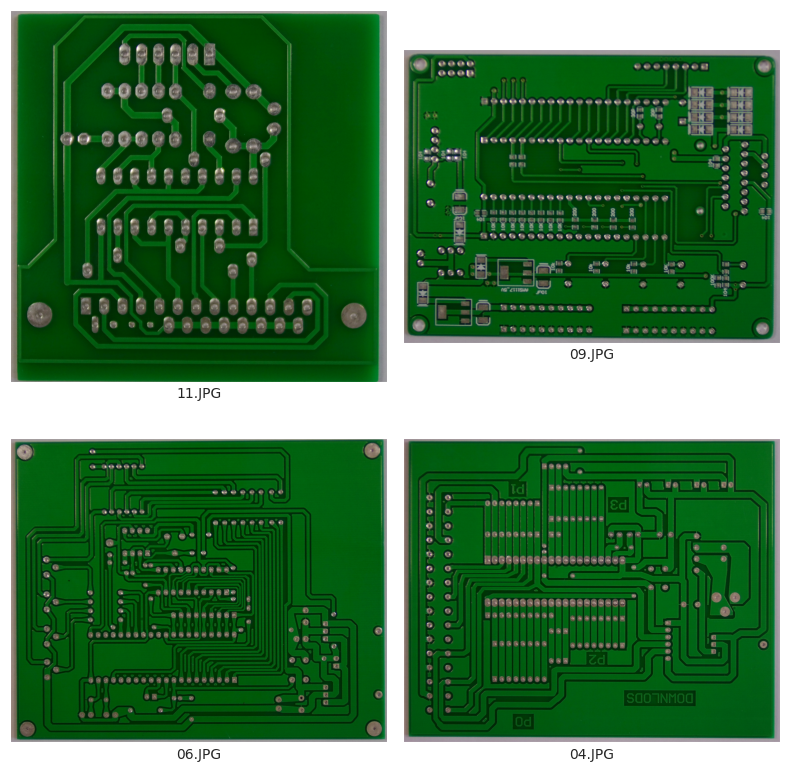

No of template images:10


In [7]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

# **Analyzing the images folder**

In [8]:

img_dir=os.path.join(input_dir,'images')

#Listing the types of defects
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Missing_hole',
 'Spur',
 'Open_circuit',
 'Mouse_bite',
 'Spurious_copper',
 'Short']

In [9]:

img_path_list=[]
#Creating img_path list
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


# **Vizualizing defect images for each type**

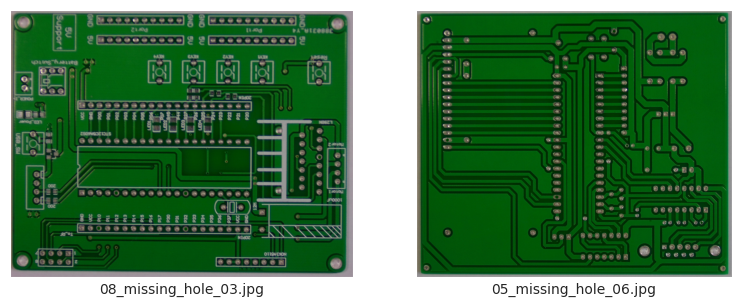

No of Missing_hole images:115


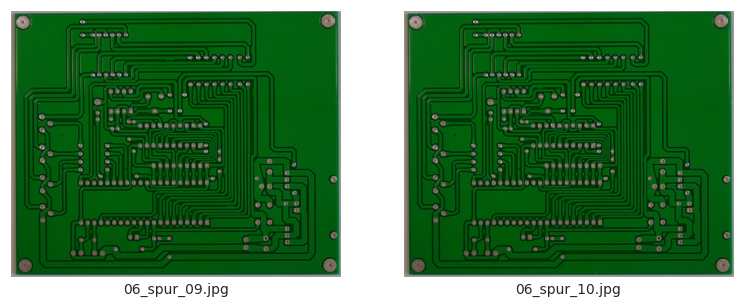

No of Spur images:115


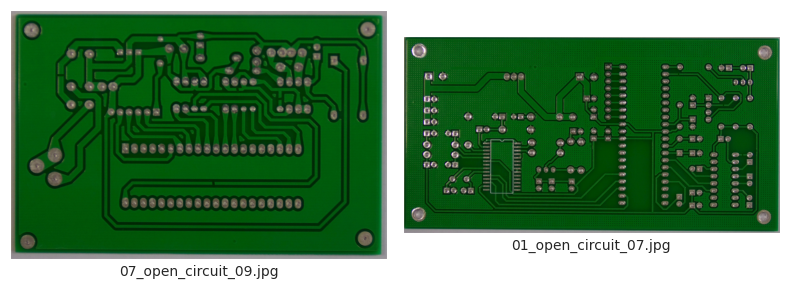

No of Open_circuit images:116


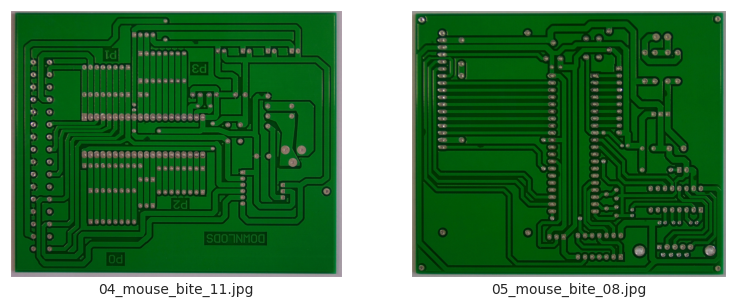

No of Mouse_bite images:115


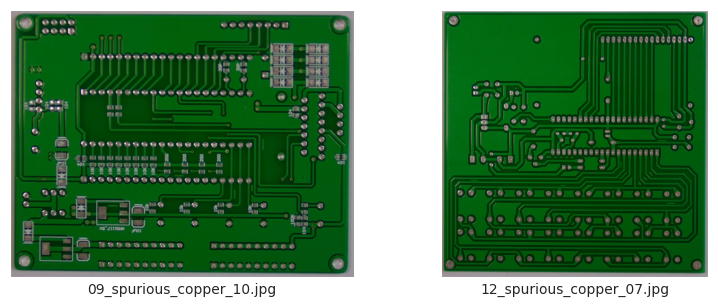

No of Spurious_copper images:116


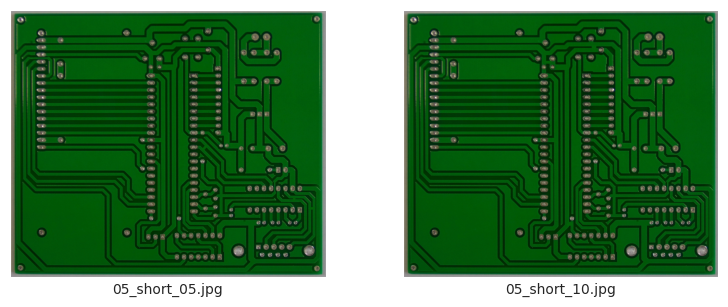

No of Short images:116


In [10]:

df_defect=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


# **No. of defects by type**

In [11]:

df_defect

,No of defect
Missing_hole,115
Spur,115
Open_circuit,116
Mouse_bite,115
Spurious_copper,116
Short,116


# **Analyzing rotated folder**

In [12]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Mouse_bite_angles.txt',
 'Open_circuit_angles.txt',
 'Mouse_bite_rotation',
 'Short_angles.txt',
 'Short_rotation',
 'Spurious_copper_rotation',
 'Spur_angles.txt',
 'Spur_rotation',
 'Missing_hole_angles.txt',
 'Spurious_copper_angles.txt',
 'Open_circuit_rotation',
 'Missing_hole_rotation']

In [13]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Mouse_bite_angles.txt',
 'Open_circuit_angles.txt',
 'Short_angles.txt',
 'Spur_angles.txt',
 'Missing_hole_angles.txt',
 'Spurious_copper_angles.txt']

In [14]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Mouse_bite_rotation',
 'Short_rotation',
 'Spurious_copper_rotation',
 'Spur_rotation',
 'Open_circuit_rotation',
 'Missing_hole_rotation']

# **Vizualizing rotated defects**

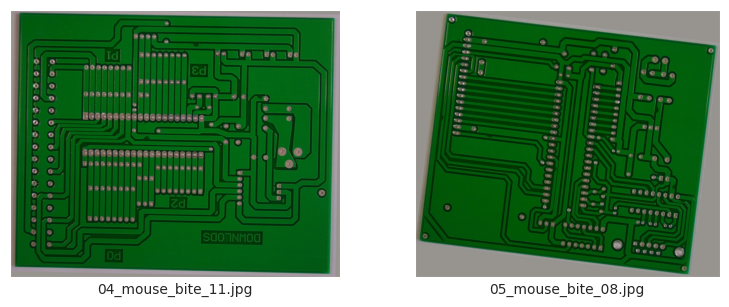

No of Mouse_bite_rotation images:115


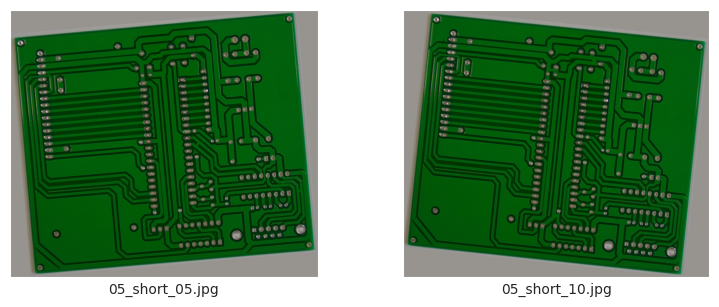

No of Short_rotation images:116


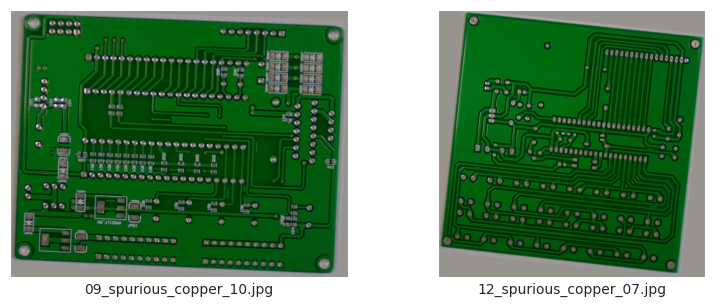

No of Spurious_copper_rotation images:116


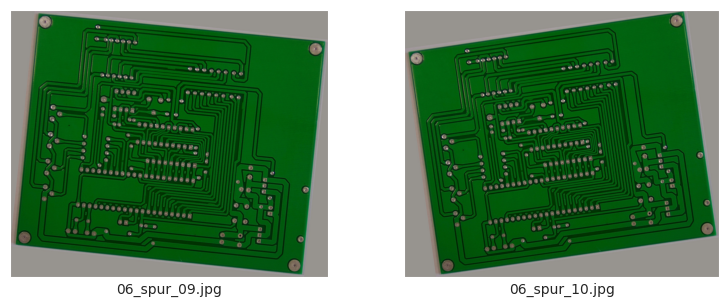

No of Spur_rotation images:115


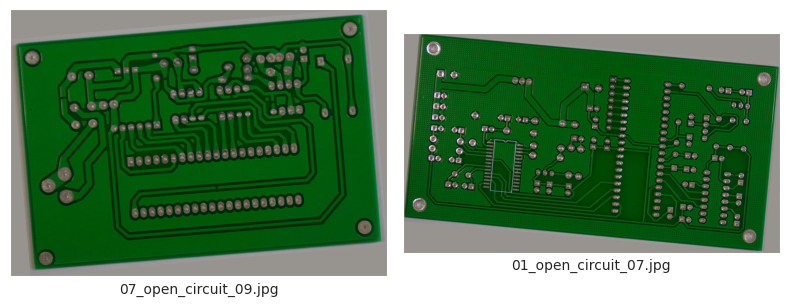

No of Open_circuit_rotation images:116


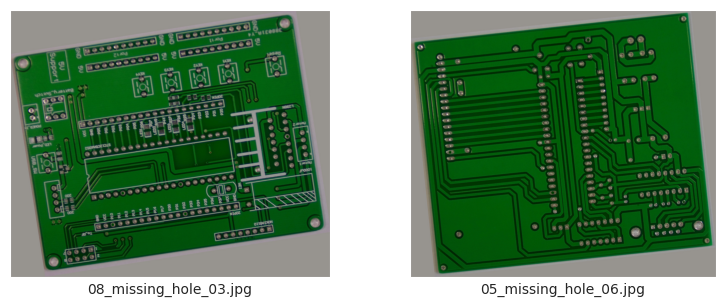

No of Missing_hole_rotation images:115


In [15]:

df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

# **No. of defects by type  rotated**

In [16]:

df_defect_rotated

,No of defect
Mouse_bite_rotation,115
Short_rotation,116
Spurious_copper_rotation,116
Spur_rotation,115
Open_circuit_rotation,116
Missing_hole_rotation,115


# **Reading the rotation text files**

In [17]:


df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [18]:
df_rotation_angle

,Line,Angle
0,04_mouse_bite_06,-4
0,12_mouse_bite_04,10
0,01_mouse_bite_17,10
0,04_mouse_bite_08,7
0,01_mouse_bite_01,-6
...,...,...
0,12_spurious_copper_04,0
0,06_spurious_copper_09,0
0,01_spurious_copper_02,-5
0,12_spurious_copper_05,-1


# **Analyzing the annotate folder**

In [19]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [20]:
type_annot=os.listdir(annote_dir)
type_annot

['Missing_hole',
 'Spur',
 'Open_circuit',
 'Mouse_bite',
 'Spurious_copper',
 'Short']

In [21]:
df_annot_nos=pd.DataFrame(columns=['No of annotations'])
#Checking the length of annotation itms
for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Missing_hole,115
Spur,115
Open_circuit,116
Mouse_bite,115
Spurious_copper,116
Short,116


# **annotation file for each image**

In [22]:

file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['04_mouse_bite_05.xml',
 '05_mouse_bite_05.xml',
 '01_mouse_bite_05.xml',
 '05_mouse_bite_09.xml',
 '06_mouse_bite_08.xml']

# **XML format, so we have to parse the data**

In [23]:

import xml.etree.ElementTree as ET



In [24]:
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()

# **getting the structure of XML file**

In [25]:

print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

# **Parsing XML to return Bounding box dimensions**

In [26]:

def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

# **Retrieving data for all files**

In [27]:

data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


# **dataframe to store the annotations**

In [28]:

df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,06_missing_hole_06.jpg,2868,2316,missing_hole,806,541,860,590
1,06_missing_hole_06.jpg,2868,2316,missing_hole,2213,1375,2284,1439
2,06_missing_hole_06.jpg,2868,2316,missing_hole,588,1292,638,1349
3,06_missing_hole_06.jpg,2868,2316,missing_hole,1620,1322,1667,1383
4,06_missing_hole_06.jpg,2868,2316,missing_hole,238,897,311,961
...,...,...,...,...,...,...,...,...
2948,07_short_07.jpg,2904,1921,short,1620,631,1722,729
2949,07_short_07.jpg,2904,1921,short,2042,884,2118,969
2950,07_short_07.jpg,2904,1921,short,1858,920,1953,1008
2951,07_short_07.jpg,2904,1921,short,1325,826,1410,910


In [29]:
import os
import shutil

img_dir = "/content/pcb_defects/PCB_DATASET/images"

# Define the source directories for each category inside img_dir
source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]


destination_dir = "/content/images_combined"

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

for source_dir in source_dirs:
    if os.path.exists(source_dir):
        # Get all files in the current directory
        files = os.listdir(source_dir)

        # Copy each file to the destination directory
        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")


files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")


Number of files copied: 693


In [30]:
destination_dir

'/content/images_combined'

# **no of defects in each pcb**

Text(0.5, 0, 'No of defects in one PCB')

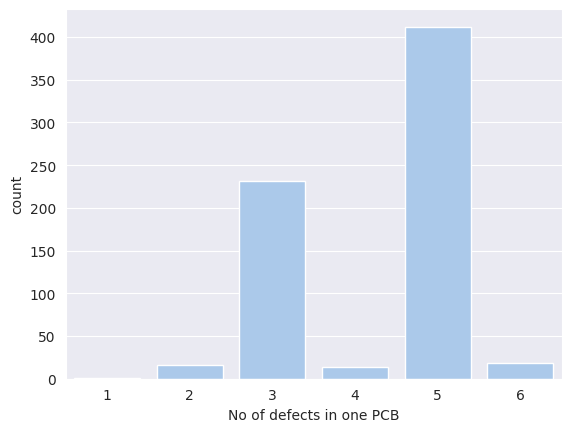

In [31]:

df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

# **bounding box**

In [32]:
#Defining a function to view image along with bounding box

def draw_bounding_boxes(image_path, bounding_boxes,annotation):
    """
    Draws multiple bounding boxes on an image using Matplotlib.

    Args:
        image_path: The path to the image file.
        bounding_boxes: A list of bounding boxes, each represented as a tuple or list containing
                       (min_x, min_y, max_x, max_y).
    """

    # Load the image
    img = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15,10))

    # Display the image
    ax.imshow(img)

    # Draw each bounding box
    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        # Add the annotation to the centroid
        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # Show the plot
    plt.show()


In [33]:
#Getting filename from filepath
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'08_missing_hole_03.jpg'

In [34]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


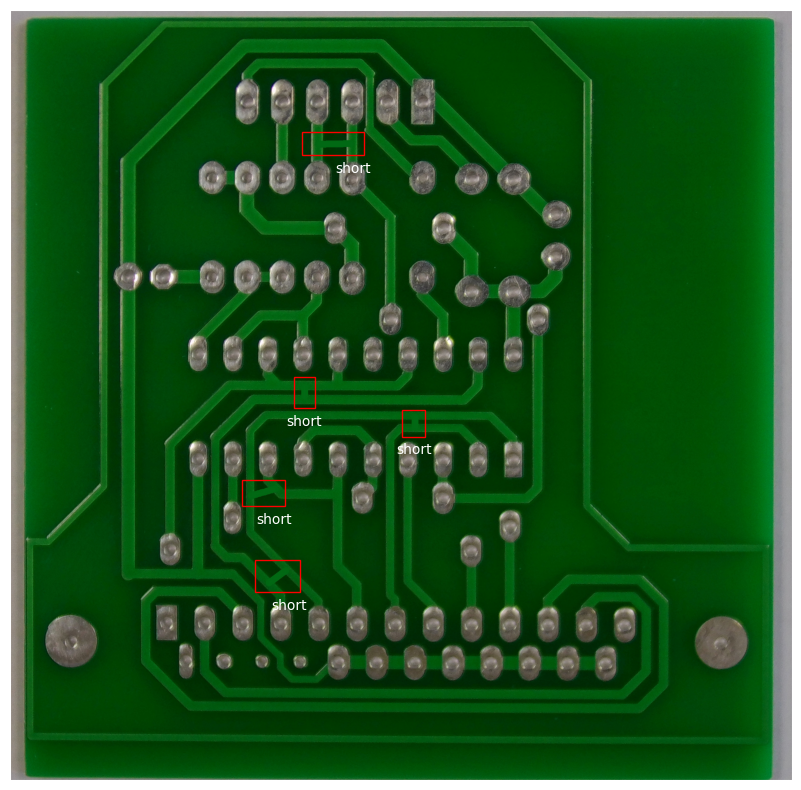

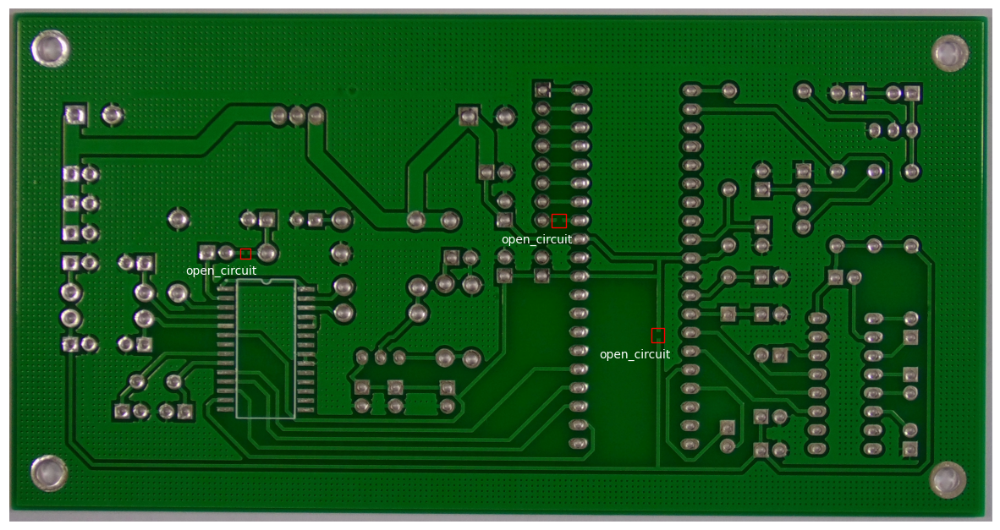

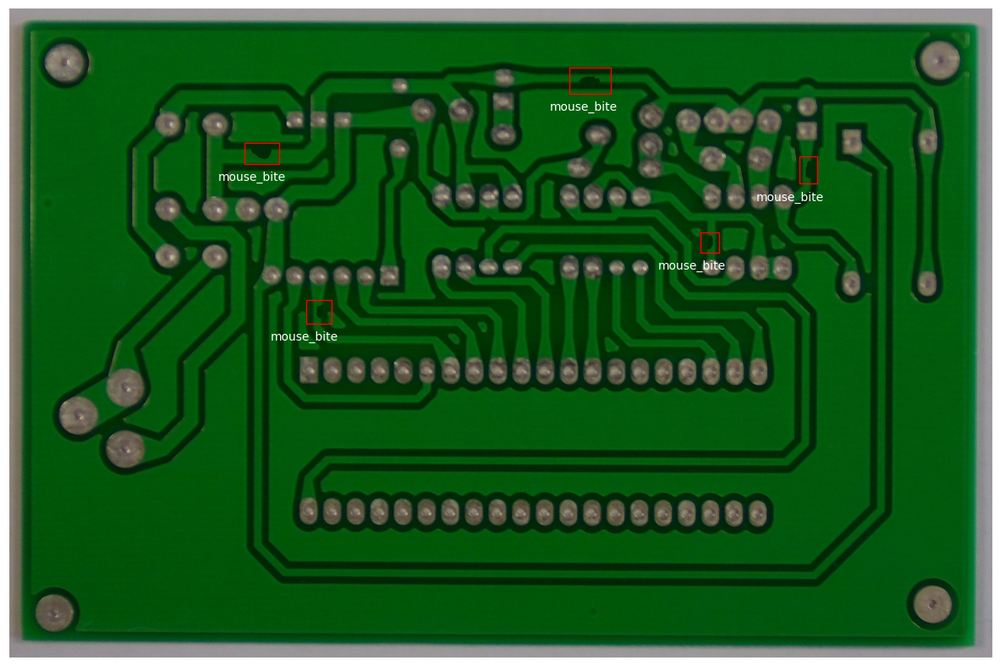

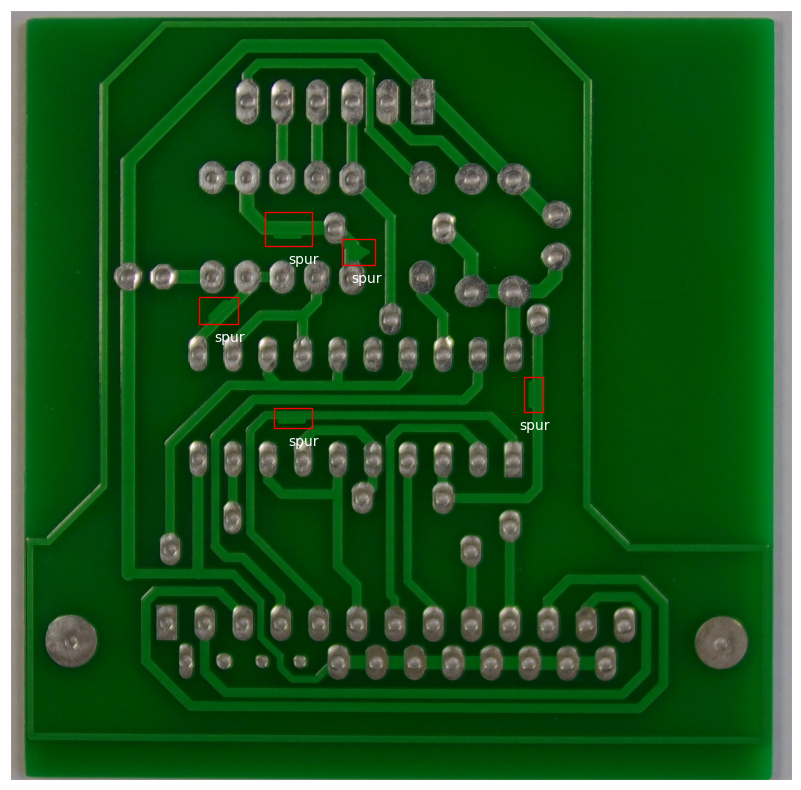

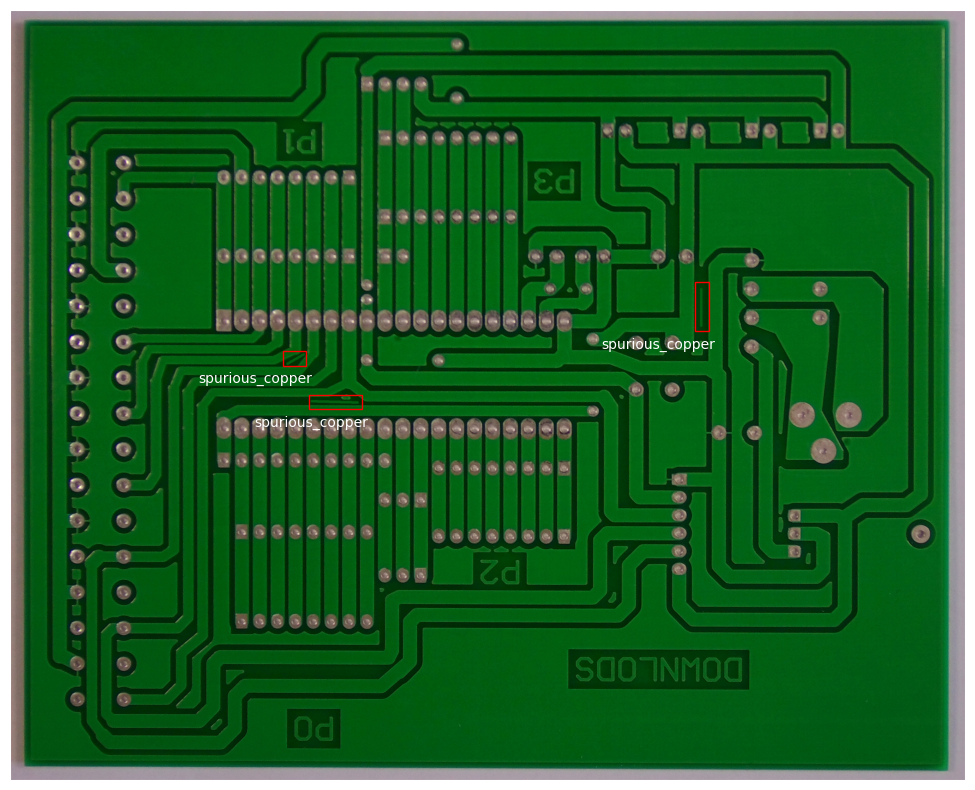

In [35]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)

PyTorch Version: 2.8.0+cu126
Using device: cuda
Preview of the provided annotation DataFrame:
                 filename  width  height    class_name  xmin  ymin  xmax  ymax
0  06_missing_hole_06.jpg   2868    2316  missing_hole   806   541   860   590
1  06_missing_hole_06.jpg   2868    2316  missing_hole  2213  1375  2284  1439
2  06_missing_hole_06.jpg   2868    2316  missing_hole   588  1292   638  1349
3  06_missing_hole_06.jpg   2868    2316  missing_hole  1620  1322  1667  1383
4  06_missing_hole_06.jpg   2868    2316  missing_hole   238   897   311   961

6 classes detected in the DataFrame: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']
Number of defects - Training: 2059, Validation: 450, Test: 444

Visualizing a batch of cropped defect patches...


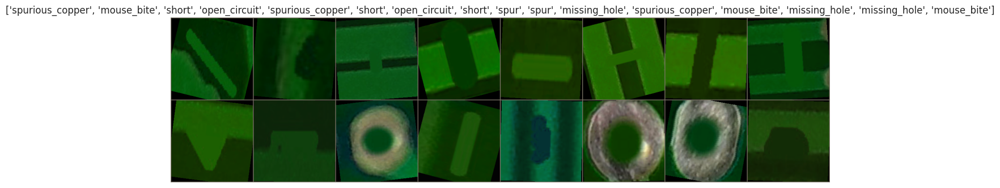

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 80.2MB/s]


Epoch 1/20 | ----------
Train Loss: 1.2424 Acc: 0.5542
Val Loss: 0.9187 Acc: 0.7022
Validation loss improved (inf -> 0.9187). Saving model...

Epoch 2/20 | ----------
Train Loss: 0.7977 Acc: 0.7659
Val Loss: 0.6141 Acc: 0.8244
Validation loss improved (0.9187 -> 0.6141). Saving model...

Epoch 3/20 | ----------
Train Loss: 0.6828 Acc: 0.7727
Val Loss: 0.5766 Acc: 0.8267
Validation loss improved (0.6141 -> 0.5766). Saving model...

Epoch 4/20 | ----------
Train Loss: 0.6019 Acc: 0.8145
Val Loss: 0.4748 Acc: 0.8733
Validation loss improved (0.5766 -> 0.4748). Saving model...

Epoch 5/20 | ----------
Train Loss: 0.5639 Acc: 0.8213
Val Loss: 0.4774 Acc: 0.8511

Epoch 6/20 | ----------
Train Loss: 0.5057 Acc: 0.8383
Val Loss: 0.4133 Acc: 0.8711
Validation loss improved (0.4748 -> 0.4133). Saving model...

Epoch 7/20 | ----------
Train Loss: 0.4724 Acc: 0.8412
Val Loss: 0.4094 Acc: 0.8556
Validation loss improved (0.4133 -> 0.4094). Saving model...

Epoch 8/20 | ----------
Train Loss: 0.4879

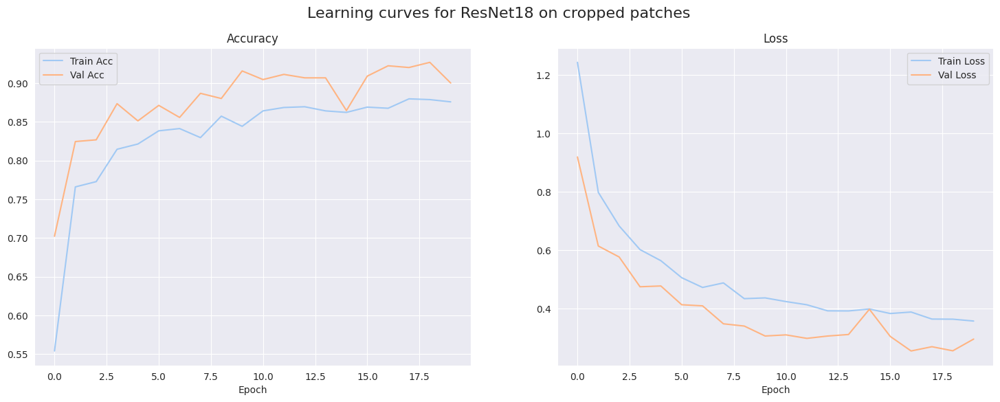


--- Final evaluation of model 'ResNet18' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     0.9684    1.0000    0.9840        92
     mouse_bite     0.7794    0.8281    0.8030        64
   open_circuit     0.9429    0.8800    0.9103        75
          short     0.9388    0.7419    0.8288        62
           spur     0.7237    0.7971    0.7586        69
spurious_copper     0.8605    0.9024    0.8810        82

       accuracy                         0.8694       444
      macro avg     0.8689    0.8583    0.8610       444
   weighted avg     0.8747    0.8694    0.8697       444



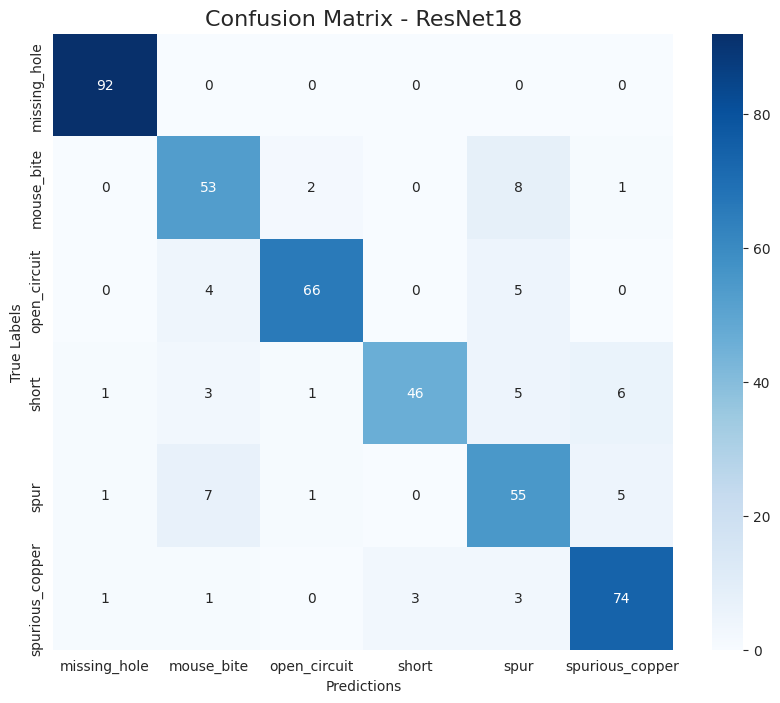

In [36]:

# 1. IMPORTING LIBRARIES AND CONFIGURATION
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms, utils

from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import time
import copy
import os

# Basic configuration
print("PyTorch Version:", torch.__version__)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# 2. DATA PREPARATION (using df_annot and img_dir)

img_dir = destination_dir


if 'class' in df_annot.columns:
    df_annot = df_annot.rename(columns={'class': 'class_name'})

print("Preview of the provided annotation DataFrame:")
print(df_annot.head())


class_names = sorted(df_annot['class_name'].unique())
num_classes = len(class_names)
print(f"\n{num_classes} classes detected in the DataFrame: {class_names}")

# --- Train/Validation/Test split based on FILE NAMES ---

unique_filenames = df_annot['filename'].unique()
train_files, test_val_files = train_test_split(unique_filenames, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=42) # 0.3 * 0.5 = 0.15

# Create DataFrames for each dataset
train_df = df_annot[df_annot['filename'].isin(train_files)].reset_index(drop=True)
val_df = df_annot[df_annot['filename'].isin(val_files)].reset_index(drop=True)
test_df = df_annot[df_annot['filename'].isin(test_files)].reset_index(drop=True)

dataset_sizes = {'train': len(train_df), 'val': len(val_df), 'test': len(test_df)}
print(f"Number of defects - Training: {dataset_sizes['train']}, Validation: {dataset_sizes['val']}, Test: {dataset_sizes['test']}")

# --- Data Augmentation and Normalization ---
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# --- Custom Dataset Class for Cropping Images ---
class PCBCropDataset(Dataset):
    def __init__(self, dataframe, image_dir, class_names, transform=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(class_names)}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_filename = row['filename']
        box = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
        label_idx = self.class_to_idx[row['class_name']]

        try:
            img_path = os.path.join(self.image_dir, img_filename)
            image = Image.open(img_path).convert('RGB')
            cropped_image = image.crop(box)
        except FileNotFoundError:
            print(f"Warning: File not found {img_path}. Returning an empty tensor.")
            return torch.zeros((3, 224, 224)), -1

        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, label_idx

# --- Creating Datasets and DataLoaders ---
train_dataset = PCBCropDataset(train_df, img_dir, class_names, transform=data_transforms['train'])
val_dataset = PCBCropDataset(val_df, img_dir, class_names, transform=data_transforms['val'])
test_dataset = PCBCropDataset(test_df, img_dir, class_names, transform=data_transforms['val'])


batch_size = 16

dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=os.cpu_count()),
    'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count()),
    'test': DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count())
}


print("\nVisualizing a batch of cropped defect patches...")
inputs, classes_idx = next(iter(dataloaders['train']))
out = utils.make_grid(inputs)

# Reverse normalization for display
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean; inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 8)); plt.imshow(inp)
    if title is not None: plt.title(title)
    plt.axis('off'); plt.show()

imshow(out, title=[class_names[x] for x in classes_idx])


# 3. PRETRAINED MODEL (ResNet18 - most performant approach)

def get_pretrained_model(num_classes):
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    # Freeze the weights of the pretrained layers
    for param in model.parameters():
        param.requires_grad = False


    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model.to(device)



# 4. TRAINING AND VALIDATION FUNCTION

def train_model(model, criterion, optimizer, num_epochs=25, patience=5):
    since = time.time()
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}' + ' | ' + '-'*10)
        for phase in ['train', 'val']:
            model.train() if phase == 'train' else model.eval()
            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'train':
                        loss.backward(); optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.item())

            if phase == 'val':
                if epoch_loss < best_loss:
                    print(f"Validation loss improved ({best_loss:.4f} -> {epoch_loss:.4f}). Saving model...")
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
            break
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s')
    print(f'Best Validation Loss: {best_loss:4f}')

    model.load_state_dict(best_model_wts)
    return model, history



# 5. TRAINING EXECUTION

# Clear GPU cache to ensure memory is free
if torch.cuda.is_available():
    #torch.cuda.empty_cache()
    pass

resnet_model = get_pretrained_model(num_classes)


criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)


best_resnet_model, history = train_model(resnet_model, criterion, optimizer, num_epochs=20, patience=5)



# 6. ANALYSIS AND EVALUATION OF RESULTS

# --- Display learning curves ---
def plot_history(history, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"Learning curves for {model_name}", fontsize=16)
    ax1.plot(history['train_acc'], label='Train Acc'); ax1.plot(history['val_acc'], label='Val Acc')
    ax1.set_title('Accuracy'); ax1.set_xlabel('Epoch'); ax1.legend(); ax1.grid(True)
    ax2.plot(history['train_loss'], label='Train Loss'); ax2.plot(history['val_loss'], label='Val Loss')
    ax2.set_title('Loss'); ax2.set_xlabel('Epoch'); ax2.legend(); ax2.grid(True)
    plt.show()

plot_history(history, "ResNet18 on cropped patches")



# **Evaluation on the test set**

In [ ]:
def evaluate_model(model, dataloader, model_name):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            y_true.extend(labels.numpy())
            y_pred.extend(predicted.cpu().numpy())

    print(f"\n--- Final evaluation of model '{model_name}' on the Test Set ---\n")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16)
    plt.xlabel('Predictions'); plt.ylabel('True Labels')
    plt.show()

evaluate_model(best_resnet_model, dataloaders['test'], "ResNet18")


# **SAVE THE TRAINED RESNET18 MODEL**

In [37]:

# 7. SAVE THE TRAINED RESNET18 MODEL


RESNET_MODEL_PATH = "/content/resnet18_trained.pth"


torch.save(best_resnet_model.state_dict(), RESNET_MODEL_PATH)

print(f" Trained ResNet18 weights saved at: {RESNET_MODEL_PATH}")


✅ Trained ResNet18 weights saved at: /content/resnet18_trained.pth


# **Test the model on a single image**

In [38]:

def test_single_prediction(model, test_loader, class_names):
    model.eval()

    # Get one batch from test loader
    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)

    with torch.no_grad():
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

    # Get first image from batch
    sample_input = inputs[0]
    actual_label = labels[0].item()
    predicted_label = preds[0].item()
    confidence = torch.softmax(outputs[0], dim=0)[predicted_label].item()

    return sample_input, actual_label, predicted_label, confidence

sample_input, actual, predicted, confidence = test_single_prediction(best_resnet_model, dataloaders['test'], class_names)
print(f"Actual: {class_names[actual]}")
print(f"Predicted: {class_names[predicted]}")
print(f"Confidence: {confidence:.4f}")


Actual: missing_hole
Predicted: missing_hole
Confidence: 0.9999


# **Calculate comprehensive metrics**

In [39]:

def get_model_metrics(model, test_loader, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    return accuracy, precision, recall, f1, all_labels, all_preds

accuracy, precision, recall, f1, true_labels, pred_labels = get_model_metrics(best_resnet_model, dataloaders['test'], class_names)

print("Final Model Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")


Final Model Performance:
Accuracy: 0.8694
Precision: 0.8747
Recall: 0.8694
F1-Score: 0.8697


 # **comprehensive results visualization**

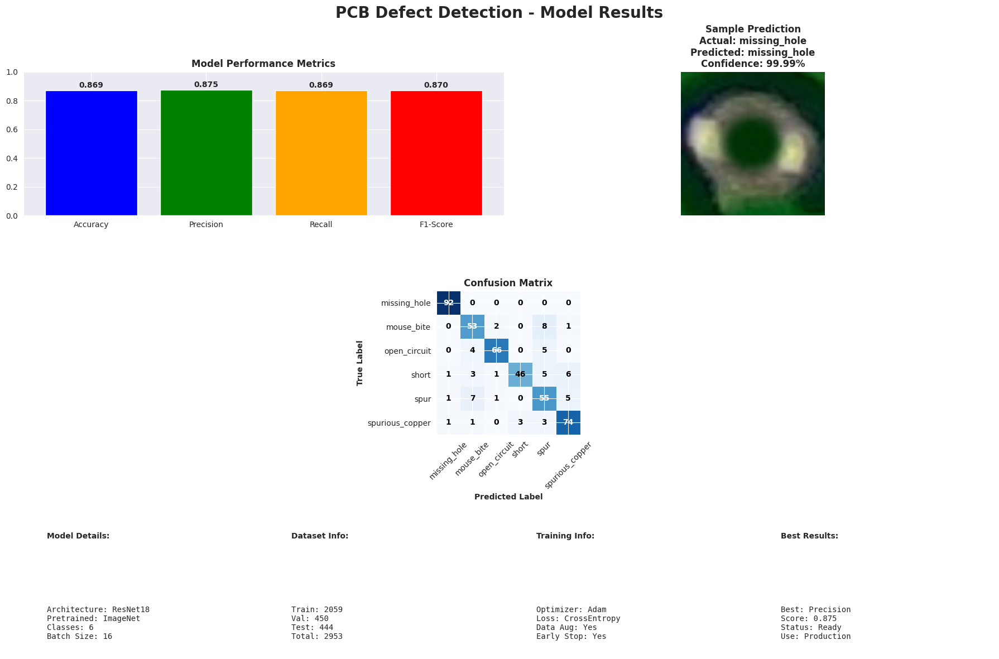

In [40]:

fig = plt.figure(figsize=(18, 12))


fig.suptitle('PCB Defect Detection - Model Results', fontsize=20, fontweight='bold')


ax1 = plt.subplot2grid((3, 4), (0, 0), colspan=2)
ax2 = plt.subplot2grid((3, 4), (0, 2), colspan=2)
ax3 = plt.subplot2grid((3, 4), (1, 0), colspan=4)
ax4 = plt.subplot2grid((3, 4), (2, 0))
ax5 = plt.subplot2grid((3, 4), (2, 1))
ax6 = plt.subplot2grid((3, 4), (2, 2))
ax7 = plt.subplot2grid((3, 4), (2, 3))

# Performance metrics
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [accuracy, precision, recall, f1]
bars = ax1.bar(metrics_names, metrics_values, color=['blue', 'green', 'orange', 'red'])
ax1.set_title('Model Performance Metrics', fontweight='bold')
ax1.set_ylim(0, 1)
for i, v in enumerate(metrics_values):
    ax1.text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')


sample_denorm = sample_input.cpu().numpy().transpose((1, 2, 0))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
sample_denorm = std * sample_denorm + mean
sample_denorm = np.clip(sample_denorm, 0, 1)

ax2.imshow(sample_denorm)
ax2.set_title(f'Sample Prediction\nActual: {class_names[actual]}\nPredicted: {class_names[predicted]}\nConfidence: {confidence:.2%}', fontweight='bold')
ax2.axis('off')

# Confusion matrix
cm = confusion_matrix(true_labels, pred_labels)
im = ax3.imshow(cm, interpolation='nearest', cmap='Blues')
ax3.set_title('Confusion Matrix', fontweight='bold')


tick_marks = np.arange(len(class_names))
ax3.set_xticks(tick_marks)
ax3.set_yticks(tick_marks)
ax3.set_xticklabels(class_names, rotation=45)
ax3.set_yticklabels(class_names)

# Add text annotations
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax3.text(j, i, format(cm[i, j], 'd'), ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black", fontweight='bold')

ax3.set_ylabel('True Label', fontweight='bold')
ax3.set_xlabel('Predicted Label', fontweight='bold')


ax4.text(0.1, 0.8, 'Model Details:', fontweight='bold', transform=ax4.transAxes)
model_info = f"Architecture: ResNet18\nPretrained: ImageNet\nClasses: {num_classes}\nBatch Size: {batch_size}"
ax4.text(0.1, 0.1, model_info, transform=ax4.transAxes, fontfamily='monospace')
ax4.axis('off')


ax5.text(0.1, 0.8, 'Dataset Info:', fontweight='bold', transform=ax5.transAxes)
data_info = f"Train: {dataset_sizes['train']}\nVal: {dataset_sizes['val']}\nTest: {dataset_sizes['test']}\nTotal: {sum(dataset_sizes.values())}"
ax5.text(0.1, 0.1, data_info, transform=ax5.transAxes, fontfamily='monospace')
ax5.axis('off')


ax6.text(0.1, 0.8, 'Training Info:', fontweight='bold', transform=ax6.transAxes)
train_info = f"Optimizer: Adam\nLoss: CrossEntropy\nData Aug: Yes\nEarly Stop: Yes"
ax6.text(0.1, 0.1, train_info, transform=ax6.transAxes, fontfamily='monospace')
ax6.axis('off')


ax7.text(0.1, 0.8, 'Best Results:', fontweight='bold', transform=ax7.transAxes)
best_metric = max(metrics_values)
best_name = metrics_names[metrics_values.index(best_metric)]
results_info = f"Best: {best_name}\nScore: {best_metric:.3f}\nStatus: Ready\nUse: Production"
ax7.text(0.1, 0.1, results_info, transform=ax7.transAxes, fontfamily='monospace')
ax7.axis('off')

plt.tight_layout()
plt.savefig('/content/pcb_results.png', dpi=300, bbox_inches='tight')
plt.show()


# **Show predictions for each defect type**

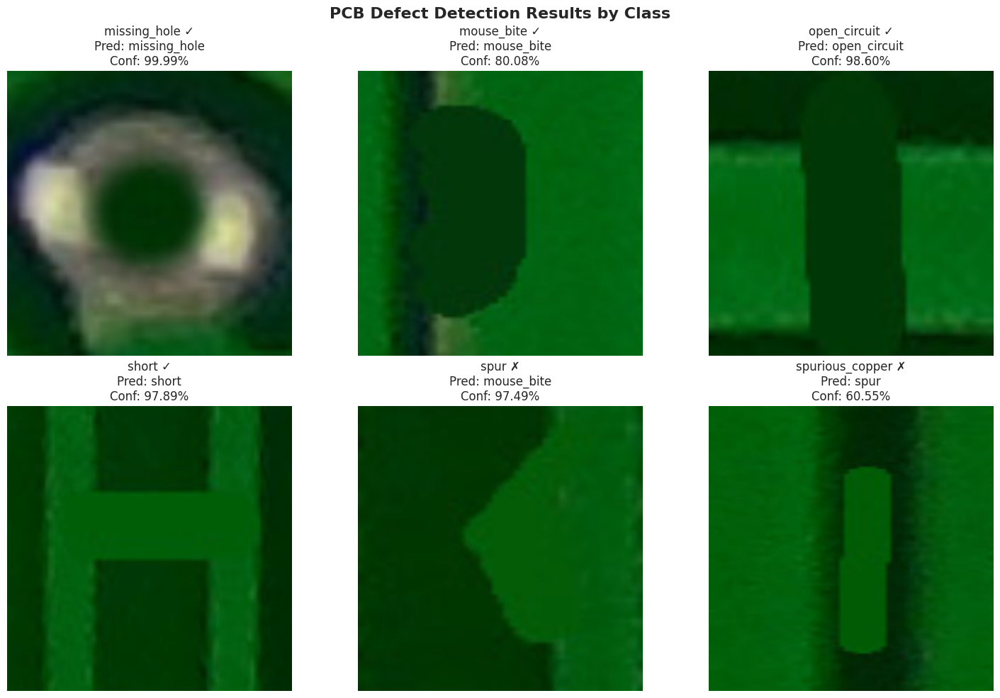

In [41]:

def show_defect_predictions(model, test_loader, class_names):
    model.eval()

    # Get samples for each class
    class_samples = {i: [] for i in range(len(class_names))}

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)

            for i in range(len(inputs)):
                label = labels[i].item()
                if len(class_samples[label]) < 1:
                    pred = preds[i].item()
                    conf = torch.softmax(outputs[i], dim=0)[pred].item()
                    class_samples[label].append((inputs[i], label, pred, conf))


    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, class_idx in enumerate(class_samples.keys()):
        if class_samples[class_idx] and idx < 6:
            sample, actual, predicted, confidence = class_samples[class_idx][0]

            # Denormalize image
            img = sample.numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            axes[idx].imshow(img)
            status = "✓" if actual == predicted else "✗"
            axes[idx].set_title(f'{class_names[actual]} {status}\nPred: {class_names[predicted]}\nConf: {confidence:.2%}')
            axes[idx].axis('off')

    plt.suptitle('PCB Defect Detection Results by Class', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('/content/defect_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()

show_defect_predictions(best_resnet_model, dataloaders['test'], class_names)


# **Print final summary**

In [42]:

print("="*60)
print("PCB DEFECT DETECTION MODEL - FINAL SUMMARY")
print("="*60)
print(f"✓ Model: ResNet18 with Transfer Learning")
print(f"✓ Dataset: {sum(dataset_sizes.values())} PCB defect samples")
print(f"✓ Classes: {', '.join(class_names)}")
print(f"✓ Accuracy: {accuracy:.3f} ({accuracy:.1%})")
print(f"✓ Precision: {precision:.3f}")
print(f"✓ Recall: {recall:.3f}")
print(f"✓ F1-Score: {f1:.3f}")
print(f"✓ Model Status: Ready for Production")
print(f"✓ Saved Model: /content/resnet18_trained.pth")
print("="*60)
print(" MODEL READY FOR PCB DEFECT DETECTION!")
print("="*60)

# Save metrics to file
metrics_dict = {
    'accuracy': float(accuracy),
    'precision': float(precision),
    'recall': float(recall),
    'f1_score': float(f1),
    'num_classes': num_classes,
    'class_names': class_names
}

import json
with open('/content/pcb_metrics.json', 'w') as f:
    json.dump(metrics_dict, f, indent=2)

print(" Metrics saved to: /content/pcb_metrics.json")


PCB DEFECT DETECTION MODEL - FINAL SUMMARY
✓ Model: ResNet18 with Transfer Learning
✓ Dataset: 2953 PCB defect samples
✓ Classes: missing_hole, mouse_bite, open_circuit, short, spur, spurious_copper
✓ Accuracy: 0.869 (86.9%)
✓ Precision: 0.875
✓ Recall: 0.869
✓ F1-Score: 0.870
✓ Model Status: Ready for Production
✓ Saved Model: /content/resnet18_trained.pth
🎯 MODEL READY FOR PCB DEFECT DETECTION!
📊 Metrics saved to: /content/pcb_metrics.json
